# Исследование рынка общественного питания в Москве

**Цель исследования**
Выявить особенности рынка общественного питания в г. Москве.

**Задачи проекта**

1. Выявить основные особенности рынка общественного питания в г. Москва
2. Детализировать анализ и подготовить предложения по открытию кофейни.

**Исходные данные** включали датасет с данными о заведениях общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.


## Изучение общей информации

In [2]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import math as mth
from scipy import stats as st
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import json
import os

In [ ]:
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [6]:
pth1 = '/Downloads/moscow_places.csv'
pth2 = 'C:/Users/dobro/Downloads/moscow_places.csv'

if os.path.exists(pth1):
    data = pd.read_csv(pth1)
elif os.path.exists(pth2):
    data = pd.read_csv(pth2)
else:
    print('Something is wrong')

#data = pd.read_csv('/datasets/moscow_places.csv')
data.info()
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В качестве исходных данных используем информацию о 8406 точках общественного питания в г. Москве. По всем точкам общественного питания приведены данные о:

- названии;
- категории;
- адресе;
- округе;
- месте расположения (географических координатах);
- рейтинге;
- принадлежности к сети.

Некоторые другие данные приведены не по всем точкам общественного питания (есть пропуски).

In [3]:
#Рассмотрим пропуски данных
print('Пропущенных значений:')
print(data.isna().sum())

Пропущенных значений:
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


По большинству точек нет данных о среднем счете, стоимости кофе и ценовом сегменте. При последующем анализе таких данных придется исключать точки с пропусками.

In [7]:
# Проверим, есть ли в представленных данных полные дубликаты
print('Дублирующих значений:', len(data) - len(data.drop_duplicates()))
print('Дублирующие значения в % от массива:', round((len(data) - len(data.drop_duplicates()))*100.0/len(data),2))

Дублирующих значений: 0
Дублирующие значения в % от массива: 0.0


In [8]:
# Проверим, есть ли в датасете неявные дубликаты
# Дубликатом считаем полное совпадение адреса и наименования заведения
# Создадим столбец, содержащий оба параметра
name_address = data['name']+data['address']
print('Неявные дубликаты:', len(data) - len(name_address.drop_duplicates()))

Неявные дубликаты: 0


Неявные дубликаты также отсутствуют.

Данные о названии заведения, категории, адресе, округе, часах работы, ценовом сегменте, среднем чеке сохранены как текст. Рассмотрим корректность заполнения категориальных данных.

In [9]:
# тип заведения
print(data['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


В датасете приведены данные по 8 типам заведений. Очевидных повторов нет.

In [10]:
# округ
print(data['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


В датасете приведены данные по 9 административным округам г. Москвы.

In [11]:
# время работы
print(data['hours'].unique())
print('Вариантов времени работы', len(data['hours'].unique()))

['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']
Вариантов времени работы 1308


Время работы отражено по-разному, всего 1308 вариантов.

In [12]:
# ценовой сегмент
print(data['price'].unique())

[nan 'выше среднего' 'средние' 'высокие' 'низкие']


В датасете по некоторым заведениям приведены данные о ценовом сегменте. Всего выделено 4 ценовых сегмента.

Данные о географических координатах, рейтинге, среднем чеке, средней цене кофе и количестве посадочных мест приведены в формате дробных чисел (в случае с числом посадочных мест это связано с наличием пропусков).

In [13]:
# принадлежность к сети
print(data['chain'].unique())

[0 1]


Данные о принадлежности заведений к сети приведены в формате целых чисел: 0 - заведение не относится к сети, 1 - относится.

**Промежуточный вывод** 
- В датасете приведены данные о 8406 точках общественного питания в г. Москве (по 9 административным округам) различного типа. 
- Дубликаты в датасете отсутствуют. 
- Имеется значительное число пропусков, однако заполнить их не представляется возможным, а удаление их из датасета на начальном этапе может привести к искажению результатов. Исключение из анализа заведений с отсутствующими данными возможно для исследования отдельных вопросов (т.е. на этапе анализа).

## Предварительная обработка данных

In [14]:
# Создадим столбец street с названием улицы
data['street'] = data['address'].str.split(', ', expand=True)[1]
print(data['street'].head(5))

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object


In [15]:
# Создадим столбец is_24/7 для обозначения заведений, работающих ежедневно и круглосуточно
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'


In [13]:
# Заменим значения NaN в столбцах с типом данных "object" на "нет данных"
data['hours'] = data['hours'].fillna(value='нет данных')
data['price'] = data['price'].fillna(value='нет данных')
data['avg_bill'] = data['avg_bill'].fillna(value='нет данных')
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Датасет дополнен столбцами, отражающими улицу и круглосуточный характер работы. Анализ пропусков показывает, что очевидного алгоритма их заполнения нет, при этом исключение заведений с пропусками на начальном этапе приведет к потери данных о большинстве заведениях. Поэтому выборки заведений, по которым имеются те или иные данные, целесообразно делать уже на этапе анализа. На данном этапе отсутствие данных заменили на слова "нет данных", что поможет в последующей визуализации.

## Анализ данных

In [16]:
# Проанализируем заведения общественного питания по категориям
data_by_cat = data.pivot_table(columns='category', values='name', aggfunc='count')                      
display(data_by_cat)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
name,765,256,603,2378,1413,633,2043,315


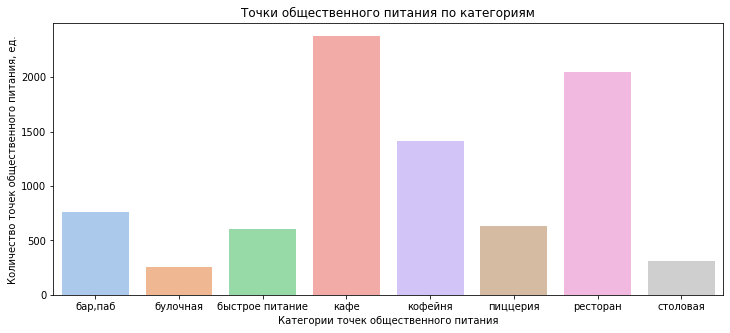

In [15]:
sns.set_palette('pastel')
plt.figure(figsize=(12, 5))
ax = sns.barplot(data=data_by_cat) 
ax.set_title('Точки общественного питания по категориям')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Количество точек общественного питания, ед.')
plt.show()

Большая часть заведений общественного питания - это кафе (2378 из 8406) или рестораны (2043 из 8406). Реже всего встречаются столовые (315) и булочные (256).

In [17]:
#Отсортируем данные по значениям
data_by_cat = data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
display(data_by_cat)

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [18]:
plt.figure(figsize=(12, 5))
fig = px.bar(data_by_cat, x='category', y='name', title='Точки общественного питания по категориям',  
             labels={'name':'Количество заведений','category':'Категория заведений'})

fig.show() 


<Figure size 864x360 with 0 Axes>

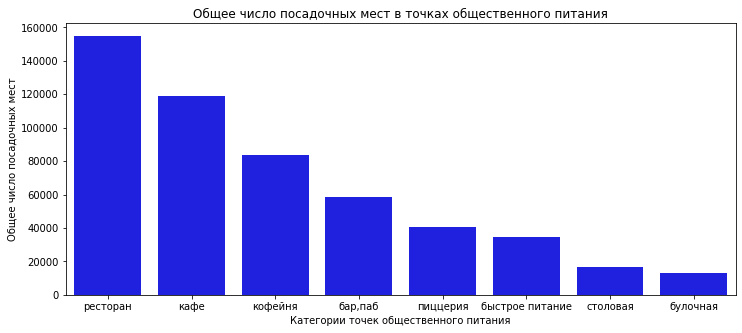

In [18]:
# Проанализируем заведения по числу посадочных мест по категориям. 
#Для этого исключим заведения, по которым отсутствуют данные по числу посадочных мест
data_seats = data.loc[data['seats'] > 0]
data_seats = data_seats.groupby('category')['seats'].sum().reset_index()
data_seats = data_seats.sort_values(by='seats', ascending=False)

sns.set_palette('pastel')
plt.figure(figsize=(12, 5))
ax = sns.barplot(x="category", y ="seats", data=data_seats, estimator=sum, color = 'blue') 
ax.set_title('Общее число посадочных мест в точках общественного питания')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Общее число посадочных мест')
plt.show()


По общему числу посадочных мест лидируют рестораны, кафе и кофейни. Меньше всего общее число посадочных мест в булочных и столовых.

,category,seats
6,ресторан,90.0
0,"бар,паб",84.0
4,кофейня,80.0
7,столовая,80.0
2,быстрое питание,75.0
3,кафе,60.0
5,пиццерия,56.0
1,булочная,52.0


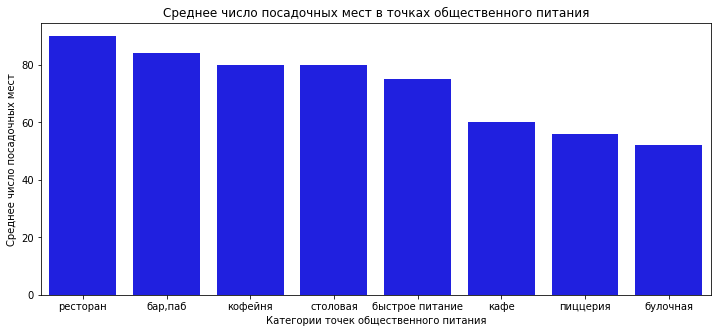

<Figure size 864x360 with 0 Axes>

In [19]:
#Проанализируем среднее число посадочных мест в зависимости от категории заведений
data_seats = data.loc[data['seats'] > 0]
data_seats_avg = data_seats.pivot_table(index='category', values='seats', aggfunc='median').reset_index()
data_seats_avg = data_seats_avg.sort_values(by=['seats'], ascending=False)
display(data_seats_avg)

#Построим обычный график
sns.set_palette('pastel')
plt.figure(figsize=(12, 5))
ax = sns.barplot(x="category", y ="seats", data=data_seats_avg, color = 'blue') 
ax.set_title('Среднее число посадочных мест в точках общественного питания')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Среднее число посадочных мест')
plt.show()

#Построим интерактивный график
plt.figure(figsize=(12, 5))
fig = px.bar(data_seats_avg, x='category', y='seats', title='Среднее число посадочных мест в точках общественного питания по категориям',  
             labels={'seats':'Количество посадочных мест','category':'Категория заведений'})
fig.show()

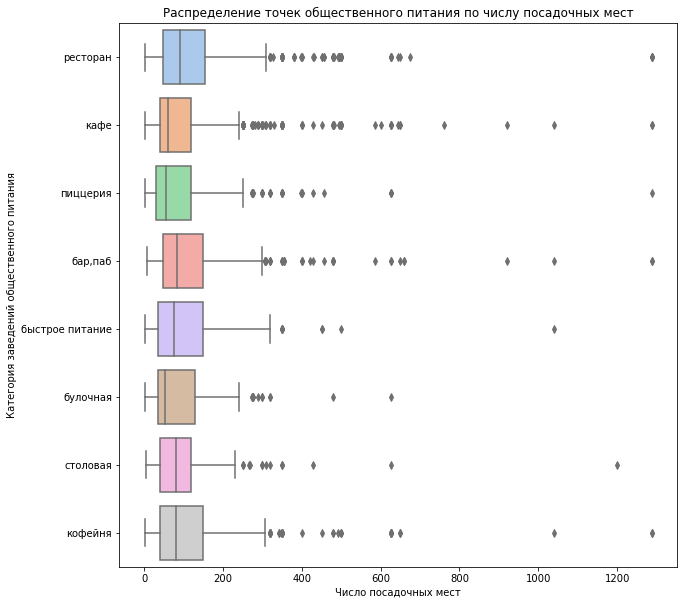

In [20]:
plt.figure(figsize=(10, 10))
ax = sns.boxplot(data=data_seats, x="seats", y="category")
ax.set_title('Распределение точек общественного питания по числу посадочных мест')
ax.set_xlabel('Число посадочных мест')
ax.set_ylabel('Категория заведений общественного питания')              
plt.show()              

    В заведениях каждой категории присутствуют "выбросы" - заведения с очень большим числом посадочных мест. Но если рассматривать первый - третий квартили, то наибольший размах по числу посадочных мест у ресторанов, кофеен и организаций быстрого питания. 

Среднее число посадочных мест выше всего в барах и пабах (более 125) и меньше всего в булочных (в среднем 96,5). Но в целом различия по числу посадочных мест в зависимости от типа заведений не очень высоки.

In [21]:
#Рассмотрим соотношение сетевых и несетевых заведений
values_series = [data['chain'].sum(), len(data) - data['chain'].sum()]
labels_series = ['Сетевые точки','Несетевые точки']

fig = go.Figure(data=[go.Pie(labels=labels_series, values=values_series)])
fig.show()


Большинство заведений, представленных в датасете - несетевые (61,9%). К сетевым относятся лишь 38,1% заведений.

In [22]:
values_series = data.groupby('chain')['seats'].sum()
labels_series = ['Сетевые точки', 'Несетевые точки']

fig = go.Figure(data=[go.Pie(labels=labels_series, values=values_series)])
fig.show()

При этом большая часть посадочных мест сконцентрирована в сетевых точках (57,5%), а на несетевые точки приходится 42,5% посадочных мест.

In [23]:
#Проанализируем, в каких заведениях больше посадочных мест
data_seats_avg = data_seats.pivot_table(index=['chain','category'], values='seats', aggfunc='mean').reset_index()
data_seats_avg = data_seats_avg.sort_values(by=['chain','category'], ascending=False)
display(data_seats_avg)

#Построим интерактивный график

plt.figure(figsize=(12, 5))
fig = px.histogram(data_seats_avg, x='category', y='seats', color='chain', barmode='group', height=400,
             title='Среднее число посадочных мест в точках общественного питания по категориям и типу заведений',  
             labels={'seats':'Количество посадочных мест','category':'Категория заведений'})
fig.show()



,chain,category,seats
15,1,столовая,109.727273
14,1,ресторан,140.638767
13,1,пиццерия,97.197531
12,1,кофейня,124.468672
11,1,кафе,107.267470
10,1,быстрое питание,118.741935
9,1,булочная,95.213483
8,1,"бар,паб",104.348624
7,0,столовая,100.269565
6,0,ресторан,114.345477


<Figure size 864x360 with 0 Axes>

In [24]:
plt.figure(figsize=(12, 5))
fig = px.histogram(data_seats_avg, x='category', y='seats', color='chain', barmode='group', height=400,
             title='Среднее число посадочных мест в точках общественного питания по категориям и типу заведений',  
             labels={'seats':'Количество посадочных мест','category':'Категория заведений'})
fig.show()

<Figure size 864x360 with 0 Axes>

Среднее количество посадочных мест в сетевых точках общественного питания превышает среднее число посадочных мест в заведениях, не отнесенных к сетям, по большинству категорий заведений. Исключение составляют булочные, а также бары и пабы. 

In [25]:
data_by_chain = data.pivot_table(index='category', columns='chain',values='name', aggfunc='count').reset_index()
data_by_chain = data_by_chain.rename(columns={'0':'несетевые', '1':'сетевые'})
display(data_by_chain)

chain,category,0,1
0,"бар,паб",596,169
1,булочная,99,157
2,быстрое питание,371,232
3,кафе,1599,779
4,кофейня,693,720
5,пиццерия,303,330
6,ресторан,1313,730
7,столовая,227,88


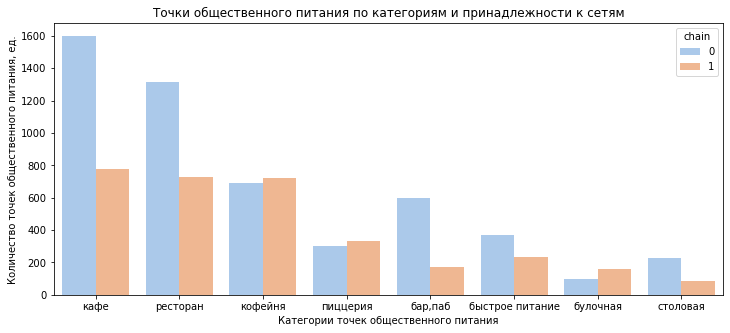

In [26]:
plt.figure(figsize=(12, 5))
ax = sns.countplot(data=data, x="category", hue="chain")
ax.set_title('Точки общественного питания по категориям и принадлежности к сетям')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Количество точек общественного питания, ед.')
plt.show()


Среди кафе, ресторанов, баров, заведений быстрого питания и столовых лидируют несетевые заведения. Кофейни, пиццерии и булочные чаще бывают сетевыми.

In [27]:
#Выделим наиболее популярные сети (имеющие наибольшее число точек)
data_by_name = data.loc[data['chain'] == 1]
data_by_name = data_by_name.groupby('name')['rating'].count().reset_index()

data_by_name = data_by_name.sort_values(by=['rating'], ascending=False).head(15)
display(data_by_name)

,name,rating
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [28]:
# отсортируем сети по числу заведений 
data_by_name = data_by_name.sort_values(by=['rating'], ascending=True)
# построим график
fig = px.bar(data_by_name, x='rating', y='name')
# оформляем график
fig.update_layout(title='ТОП-15 сетей общественного питания в г. Москва',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование сети')
fig.show() # выводим график


Самые популярные сети в Москве - кофейни и пиццерии. Наибольшее число точек у "Шоколадницы" - 120. Далее со значительным отрывом идут Доминос Пицца и Додо Пицца. 

Вторая особенность перечня - развитая доставка блюд у многих сетей-лидеров (пиццерии, Яндекс Лавка).

Отметим, что все заведения относятся к бюджетным заведениям, ориентированным на массовый сегмент потребителей.

In [29]:
#Рассчитаем число заведений по категориям в разрезе административных округов
data_by_district = data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
data_by_district['всего'] = (data_by_district['бар,паб'] + data_by_district['булочная'] + data_by_district['быстрое питание'] 
                            + data_by_district['кафе'] +data_by_district['кофейня']+data_by_district['пиццерия']
                            +data_by_district['ресторан'] + data_by_district['столовая']) 
display(data_by_district)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


In [30]:
#Проанализируем распределение заведений общественного питания по административным округам и категориям заведений

fig = px.line(data_by_district, title='Количество заведений общественного питания по округам и категориям',
             width=1000, height=700)
fig.update_xaxes(tickangle=45) 
fig.show()

Закономерно, что больше всего заведений сосредоточено в центре города - в Центральном административном округе. Меньше всего заведений - в Северо-Западном административном округе.
В Центральном округе по категориям заведений лидируют рестораны, а во всех остальных округах - кафе. Это закономерно: более дорогие заведения концентрируются ближе к центру, более бюджетные - в спальных районах.

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


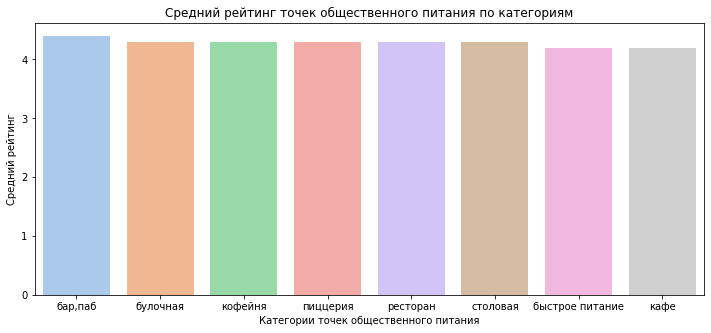

In [31]:
#Проанализируем распределение средних рейтингов по категориям заведений

data_rating_cat = data.pivot_table(index='category', values='rating', aggfunc='median').reset_index()
data_rating_cat = data_rating_cat.sort_values(by=['rating'], ascending=False)
display(data_rating_cat)

#Построим обычный график
sns.set_palette('pastel')
plt.figure(figsize=(12, 5))
ax = sns.barplot(x="category", y ="rating", data=data_rating_cat) 
ax.set_title('Средний рейтинг точек общественного питания по категориям')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Средний рейтинг')
plt.show()

 Средний рейтинг заведений общественного питания незначительно различается в зависимости от категории заведения. Выше всего рейтинг у баров и пабов - 4,4 балла; ниже всего - у заведений быстрого питания и кафе - 4,2 балла.

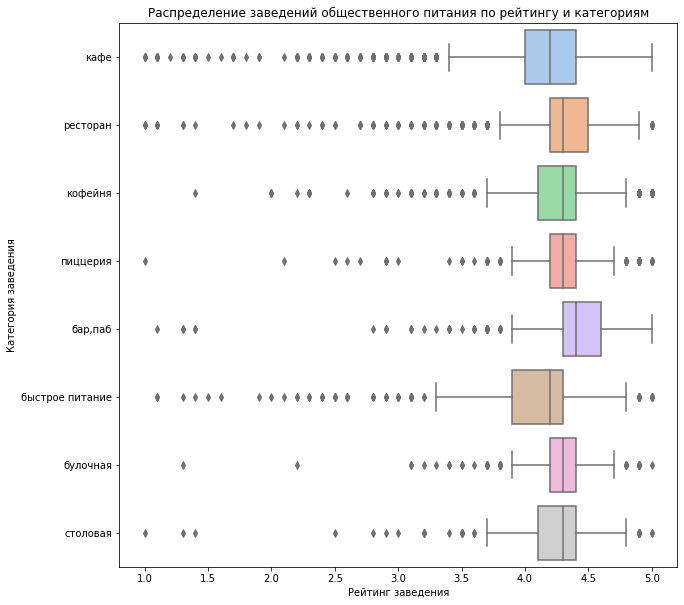

In [32]:
plt.figure(figsize=(10, 10))
ax = sns.boxplot(data=data, x="rating", y="category")
ax.set_title('Распределение заведений общественного питания по рейтингу и категориям')
ax.set_xlabel('Рейтинг заведения')
ax.set_ylabel('Категория заведения')
plt.show()

Наиболее широкое распределение оценок у ресторанов быстрого питания и кафе. Меньше всего разброс рейтингов пользователей у булочных и пиццерий. Отметим, что 5-балльные оценки есть только у отдельных баров, пабов и кафе.

In [33]:
#Проанализируем средний рейтинг заведений по районам
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
display(rating_df)

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [34]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m


В целом, медианные рейтинги заведений по Москве различаются незначительно. Тем не менее, наиболее высокий рейтинг у заведений Центрального административного округа (4,4 балла), а наименее высокий - у заведений в Юго-Восточном и Северо-Восточном административных округах (4,2 балла).

Лидерство ЦАО по рейтингам пользователей и другим показателям объясняется тем, что в ЦАО расположен центр города. Здесь сконцентрировано множество туристических точек притяжения и административных зданий. Именно здесь находятся лучшие точки общественного питания, услугами которых пользуются и москвичи, и гости столицы, и в течение рабочей недели (поскольку в ЦАО сосредоточено много рабочих мест), и на выходных.

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m


In [34]:
#Выделим улицы, где расположено больше всего заведений

data_by_street = data.pivot_table(index='street', columns='category', 
                                  values='rating', aggfunc='count', margins=True).fillna(value=0)

data_by_street_15 = data_by_street.sort_values(by=['All'], ascending=False).head(16)
display(data_by_street_15)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
street,,,,,,,,,
All,765.0,256.0,603.0,2378.0,1413.0,633.0,2043.0,315.0,8406
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76


In [37]:
data_by_street_15 = data_by_street_15.loc[data_by_street['All'] < 200]

fig = px.line(data_by_street_15, title='Улицы с наибольшим числом заведений',
             width=1000, height=700)
fig.update_xaxes(tickangle=45) 
fig.show()

Больше всего заведений сконцентрировано на протяженных вылетных магистралях (проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект и т.д.). 

Кафе чаще всего расположены на проспекте Мира и МКАД. Больше всего ресторанов на вылетных магистралях престижных направлений (проспект Вернадского, Ленинский проспект, Ленинградское шоссе). Кофейни чаще встречаются на проспекте Мира и Ленинградском проспекте.

In [38]:
#Выделим улицы, на которых находится только 1 объект общепита
data_by_street_1 = data_by_street.loc[data_by_street['All'] == 1]
data_by_street_1 = data_by_street
print(data_by_street_1)

category                  бар,паб  булочная  быстрое питание    кафе  кофейня  \
street                                                                          
1-й Автозаводский проезд      0.0       0.0              0.0     1.0      0.0   
1-й Балтийский переулок       0.0       0.0              0.0     0.0      0.0   
1-й Варшавский проезд         0.0       0.0              0.0     1.0      0.0   
1-й Вешняковский проезд       0.0       0.0              0.0     1.0      0.0   
1-й Волоколамский проезд      0.0       0.0              0.0     1.0      1.0   
...                           ...       ...              ...     ...      ...   
улица Юных Ленинцев           2.0       0.0              0.0     4.0      1.0   
улица Яблочкова               0.0       1.0              0.0     0.0      1.0   
шоссе Энтузиастов             1.0       2.0              4.0    10.0      7.0   
№ 7                           0.0       0.0              0.0     1.0      0.0   
All                         

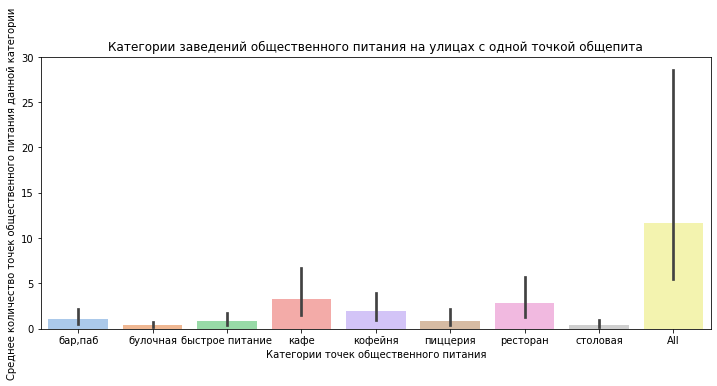

In [39]:
plt.figure(figsize=(12, 5))

ax = sns.barplot(data=data_by_street_1) 
ax.set_title('Категории заведений общественного питания на улицах с одной точкой общепита')
ax.set_xlabel('Категории точек общественного питания')
ax.set_ylabel('Среднее количество точек общественного питания данной категории')
plt.show()

В датасете 458 улиц, на которых расположена только одна точка общественного питания. Чаще всего это кафе или ресторан. Реже всего - булочная или пиццерия.

<Figure size 1080x1080 with 0 Axes>

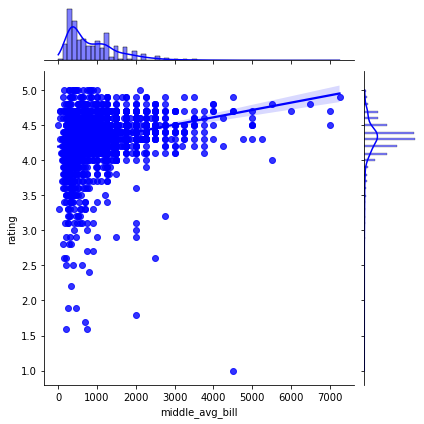

In [35]:
# Рассмотрим, как различается средний чек в зависимости от рейтинга заведения
plt.figure(figsize=(15, 15))
ax = sns.jointplot(
x="middle_avg_bill",
y="rating",
data=data.loc[data['middle_avg_bill']<10000],
kind='reg', # дополнительное построение плотности распределения и регрессии
color='blue') 
plt.show()

С ростом среднего чека рейтинг заведений несколько возрастает, но и в нижнем ценовом сегменте есть много заведений с высоким рейтингом. 

**Общий вывод**

Большая часть заведений общественного питания - это кафе (2378 из 8406) или рестораны (2043 из 8406). Реже всего встречаются столовые (315) и булочные (256).

По общему числу посадочных мест лидируют рестораны, кафе и кофейни. Меньше всего общее число посадочных мест в булочных и столовых.

Большинство заведений, представленных в датасете - несетевые (61,9%). К сетевым относятся лишь 38,1% заведений.

При этом большая часть посадочных мест сконцентрирована в сетевых точках (57,5%), а на несетевые точки приходится 42,5% посадочных мест.

Среднее количество посадочных мест в сетевых точках общественного питания превышает среднее число посадочных мест в заведениях, не отнесенных к сетям, по большинству категорий заведений. Исключение составляют булочные, а также бары и пабы. 

Среди кафе, ресторанов, баров, заведений быстрого питания и столовых лидируют несетевые заведения. Кофейни, пиццерии и булочные чаще бывают сетевыми.

Самые популярные сети в Москве - кофейни и пиццерии. Наибольшее число точек у "Шоколадницы" - 120. Далее со значительным отрывом идут Доминос Пицца и Додо Пицца. 

Вторая особенность перечня ведущих сетей общественного питания - развитая доставка блюд у многих сетей-лидеров (пиццерии, Яндекс Лавка).

Закономерно, что больше всего заведений сосредоточено в центре города - в Центральном административном округе. Меньше всего заведений - в Северо-Западном административном округе.

В Центральном округе по категориям заведений лидируют рестораны, а во всех остальных округах - кафе. 

Средний рейтинг заведений общественного питания незначительно различается в зависимости от категории заведения. Выше всего рейтинг у баров и пабов - 4,4 балла; ниже всего - у заведений быстрого питания и кафе - 4,2 балла.

Медианные рейтинги заведений по Москве различаются незначительно. Тем не менее, наиболее высокий рейтинг у заведений Центрального административного округа (4,4 балла), а наименее высокий - у заведений в Юго-Восточном и Северо-Восточном административных округах (4,2 балла).

Больше всего заведений сконцентрировано на протяженных вылетных магистралях (проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект и т.д.). 

Кафе чаще всего расположены на проспекте Мира и МКАД. Больше всего ресторанов на вылетных магистралях престижных направлений (проспект Вернадского, Ленинский проспект, Ленинградское шоссе). Кофейни чаще встречаются на проспекте Мира и Ленинградском проспекте.

В датасете 458 улиц, на которых расположена только одна точка общественного питания. Чаще всего это кафе или ресторан. Реже всего - булочная или пиццерия.

С ростом среднего чека рейтинг заведений несколько возрастает, но и в нижнем ценовом сегменте есть много заведений с высоким рейтингом. 

## Детализация исследования: открытие кофейни

In [41]:
#Выделим кофейни в датасете
coffee_shops = data.loc[data['category']=='кофейня']
print(len(coffee_shops))

1413


В датасете приведены данные по 1413 кофейням г. Москва.

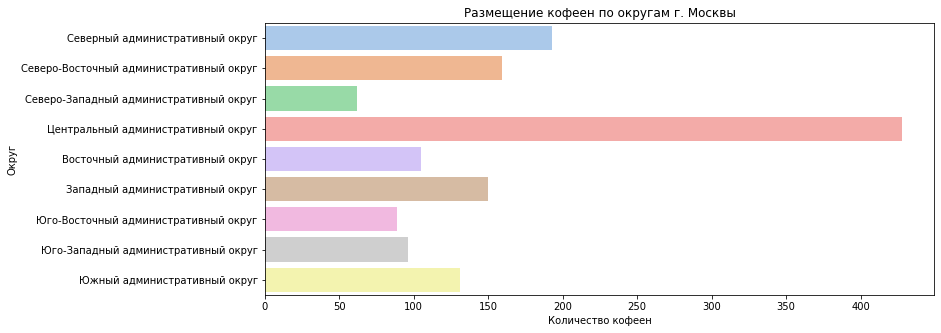

In [42]:
plt.figure(figsize=(12, 5))
ax = sns.countplot(data=coffee_shops, y='district') 
ax.set_title('Размещение кофеен по округам г. Москвы')
ax.set_xlabel('Количество кофеен')
ax.set_ylabel('Округ')
plt.show()

Больше всего кофеен расположено в Центральном административном округе г. Москвы (428). На втором месте по числу кофеен Северный административный округ, на третьем - Северо-Восточный. Меньше всего кофеен в Северо-Западном, Юго-Восточном и Юго-Западном округах города.

In [43]:
#Рассмотрим расположение кофеен на карте города
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shops.apply(create_clusters, axis=1)

# выводим карту
m


Кофейни часто размещают в деловых и торговых центров, вдоль "вылетных" магистралей.

In [44]:
print(len(coffee_shops.loc[coffee_shops['is_24/7'] == True]))

59


Среди 1413 кофеен Москвы только 59 работают круглосуточно. Рассмотрим, где они расположены.

In [45]:
coffee_shops_24 = coffee_shops.loc[coffee_shops['is_24/7'] == True]

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера к первым 5 записям датафрейма
coffee_shops_24.apply(create_marker, axis=1)
    
# выводим карту
m


Большинство круглосуточных кофеен расположены в центре. В спальных районах они встречаются гораздо реже, особенно в Северном и Южном административных округах.

In [46]:
# рассмотрим рейтинги кофеен в разрезе округов

rating_df = coffee_shops.groupby('district', as_index=False)['rating'].agg('median')
display(rating_df)
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m


,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Рейтинги кофеен в большинстве округов города составляют 4,3 балла. Более низкие рейтинги только в Западном административном округе.

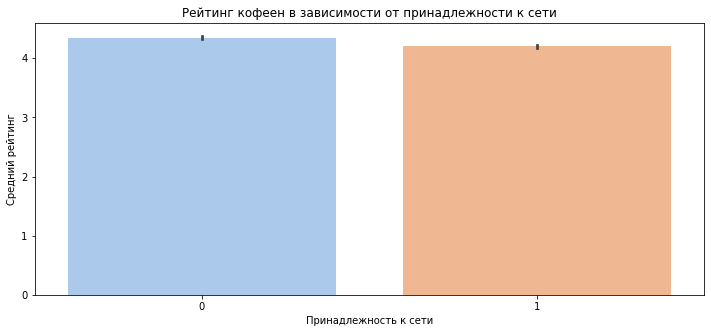

In [47]:
plt.figure(figsize=(12, 5))
ax = sns.barplot(data=coffee_shops, y='rating', x='chain') 
ax.set_title('Рейтинг кофеен в зависимости от принадлежности к сети')
ax.set_xlabel('Принадлежность к сети')
ax.set_ylabel('Средний рейтинг')
plt.show()

Рейтинги сетевых кофеен несколько ниже рейтингов несетевых кофеен.

In [48]:
# Рассмотрим среднюю стоимость чашки кофе в зависимости от округа

cup_price = coffee_shops.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
display(cup_price)
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
m


,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


Стоимость чашки кофе зависит от района города. Дешевле всего кофе стоит в Восточном административном округе: средняя чашка кофе в кофейнях ВАО составляет 135 руб. Далее идут Юго-Восточный и Южный округа Москвы: там кофе стоит 147,5 руб. и 150 руб. за чашку соответственно. Еще дороже кофе в СЗАО, САО и СВАО: в кофейнях этих округов чаша обойдется от 159 до 165 руб. Наконец, самый дорогой кофе в Центральном, Западном и Юго-Западном округах. Маскимальная медианная цена по округу (ЮЗАО) составляет 198 руб. за чашку.

<Figure size 720x1440 with 0 Axes>

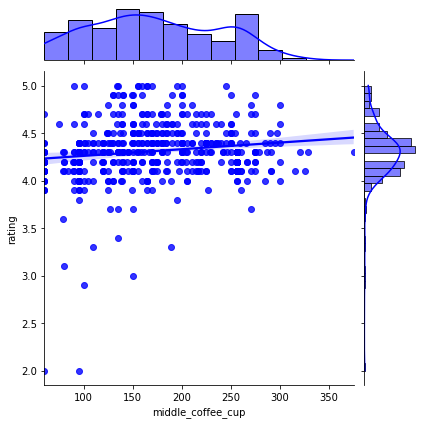

In [49]:
# Рассмотрим, как различается средняя стоимость кофе в зависимости от рейтинга заведения
plt.figure(figsize=(10, 20))
ax = sns.jointplot(
x="middle_coffee_cup",
y="rating",
data=coffee_shops.loc[coffee_shops['middle_coffee_cup']<1000],
kind='reg', # дополнительное построение плотности распределения и регрессии
color='blue') 
plt.show()

Рейтинг кофеен с более дорогой стоимостью кофе немного выше, чем кофеен с низкой стоимостью кофе. И наоборот, кофейни со стоимостью кофе 300 р. и выше имеют рейтинг не ниже 4. Таким образом, установление цены ниже рынка не приведет к росту рейтинга заведения. При установлении цен рекомендуется ориентироваться на среднерыночные цены по соответствующему округу.

**Рекомендуемая цена за чашку кофе зависит от выбираемого места размещения кофейни. При открытии кофейни в ЗАО, ЦАО или ЮЗАО рекомендуемая цена - 190 руб. При открытии кофейни в одном из северных округов столицы (СЗАО, САО или СВАО) рекомендуемая цена 160 руб. за чашку. При открытии кофейни на юге или юго-востоке города - 150 руб. за чашку, при открытии кофейни в ВАО - 135 руб. за чашку.**

**Исходя из проведенного анализа рекомендуется открыть новую кофейню в Юго-западном административном округе г. Москвы**

- в данном округе сравнительно мало кофеен: конкуренция не очень велика;
- средняя стоимость кофе в ЮЗАО - самая высокая в Москве. Заведение быстрее окупится;
- в Москве редки кофейни, работающие круглосуточно. Рекомендуется рассмотреть этот формат, он может пользоваться повышенным спросом.

При размещении кофейни рекомендуется ориентироваться на деловые и торговые центры (в последнем случае предпочтительнее у метро или станций МЖД).

## Общий вывод

**Целью исследования** было выявление особенностей рынка общественного питания в г. Москве и подготовка предложений для потенциальных инвесторов.

**Исходные данные** включали датасет с данными о заведениях общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Датасет включает данные о 8406 точках общественного питания в г. Москве. По всем точкам общественного питания приведены данные о:

- названии;
- категории;
- адресе;
- округе;
- месте расположения (географических координатах);
- рейтинге;
- принадлежности к сети.

По итогам **предварительной обработки** данных дубликатов не выявлено, но выявлено значительное число пропусков, однако заполнить их не представляется возможным, а удаление их из датасета на начальном этапе может привести к искажению результатов. Исключение из анализа заведений с отсутствующими данными возможно для исследования отдельных вопросов (т.е. на этапе анализа).

В рамках **предварительного анализа** данные дополнены сведениями об улицах, на которых расположены заведения общественного питания и выделены заведения, работающие круглосуточно.

**Анализ данных** позволил сделать следующие выводы:

1. Большая часть заведений общественного питания - это кафе (2378 из 8406) или рестораны (2043 из 8406). Реже всего встречаются столовые (315) и булочные (256).

2. По общему числу посадочных мест лидируют рестораны, кафе и кофейни. Меньше всего общее число посадочных мест в булочных и столовых.

3. Большинство заведений, представленных в датасете - несетевые (61,9%). К сетевым относятся лишь 38,1% заведений. При этом большая часть посадочных мест сконцентрирована в сетевых точках (57,5%), а на несетевые точки приходится 42,5% посадочных мест.

4. Среднее количество посадочных мест в сетевых точках общественного питания превышает среднее число посадочных мест в заведениях, не отнесенных к сетям, по большинству категорий заведений. Исключение составляют булочные, а также бары и пабы. 

5. Среди кафе, ресторанов, баров, заведений быстрого питания и столовых лидируют несетевые заведения. Кофейни, пиццерии и булочные чаще бывают сетевыми.

6. Самые популярные сети в Москве - кофейни и пиццерии. Наибольшее число точек у "Шоколадницы" - 120. Далее со значительным отрывом идут Доминос Пицца и Додо Пицца. Вторая особенность перечня ведущих сетей общественного питания - развитая доставка блюд у многих сетей-лидеров (пиццерии, Яндекс Лавка).

7. Закономерно, что больше всего заведений сосредоточено в центре города - в Центральном административном округе. Меньше всего заведений - в Северо-Западном административном округе.

8. В Центральном округе по категориям заведений лидируют рестораны, а во всех остальных округах - кафе. 

9. Средний рейтинг заведений общественного питания незначительно различается в зависимости от категории заведения. Выше всего рейтинг у баров и пабов - 4,4 балла; ниже всего - у заведений быстрого питания и кафе - 4,2 балла.

10. Медианные рейтинги заведений по Москве различаются незначительно. Тем не менее, наиболее высокий рейтинг у заведений Центрального административного округа (4,4 балла), а наименее высокий - у заведений в Юго-Восточном и Северо-Восточном административных округах (4,2 балла).

11. Больше всего заведений сконцентрировано на протяженных вылетных магистралях (проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект и т.д.). 

12. Кафе чаще всего расположены на проспекте Мира и МКАД. Больше всего ресторанов на вылетных магистралях престижных направлений (проспект Вернадского, Ленинский проспект, Ленинградское шоссе). Кофейни чаще встречаются на проспекте Мира и Ленинградском проспекте.

13. В датасете 458 улиц, на которых расположена только одна точка общественного питания. Чаще всего это кафе или ресторан. Реже всего - булочная или пиццерия.

14. С ростом среднего чека рейтинг заведений несколько возрастает, но и в нижнем ценовом сегменте есть много заведений с высоким рейтингом.

Отдельно были проанализированы данные, необходимые для принятия решения **об открытии кофейни**.

Всего в датасете есть сведения о 1413 кофейнях. Больше всего кофеен расположено в Центральном административном округе г. Москвы (428). На втором месте по числу кофеен Северный административный округ, на третьем - Северо-Восточный. Меньше всего кофеен в Северо-Западном, Юго-Восточном и Юго-Западном округах города.

Среди 1413 кофеен только 59 работают круглосуточно. Большинство круглосуточных кофеен расположены в центре. В спальных районах они встречаются гораздо реже, особенно в Северном и Южном административных округах.

Во всех округах, кроме ЗАО, медианный рейтинг кофеен составляет 4,3 балла (в ЗАО - 4,2 балла). У сетевых кофеен рейтинги немного ниже, чем у кофеен, не принадлежащих сетям.

Стоимость чашки кофе зависит от района города. Дешевле всего кофе стоит в Восточном административном округе: средняя чашка кофе в кофейнях ВАО составляет 135 руб. Далее идут Юго-Восточный и Южный округа Москвы: там кофе стоит 147,5 руб. и 150 руб. за чашку соответственно. Еще дороже кофе в СЗАО, САО и СВАО: в кофейнях этих округов чаша обойдется от 159 до 165 руб. Наконец, самый дорогой кофе в Центральном, Западном и Юго-Западном округах. Маскимальная медианная цена по округу (ЮЗАО) составляет 198 руб. за чашку.

Рекомендуемая цена за чашку кофе зависит от выбираемого места размещения кофейни. При открытии кофейни в ЗАО, ЦАО или ЮЗАО рекомендуемая цена - 190 руб. При открытии кофейни в одном из северных округов столицы (СЗАО, САО или СВАО) рекомендуемая цена 160 руб. за чашку. При открытии кофейни на юге или юго-востоке города - 150 руб. за чашку, при открытии кофейни в ВАО - 135 руб. за чашку.

**Исходя из проведенного анализа рекомендуется открыть новую кофейню в Юго-западном административном округе г. Москвы**

- в данном округе сравнительно мало кофеен: конкуренция не очень велика;
- средняя стоимость кофе в ЮЗАО - самая высокая в Москве. Заведение быстрее окупится;
- в Москве редки кофейни, работающие круглосуточно. Рекомендуется рассмотреть этот формат, он может пользоваться повышенным спросом.

При размещении кофейни рекомендуется ориентироваться на деловые и торговые центры (в последнем случае предпочтительнее у метро или станций МЖД).

Ссылка на презентацию: https://disk.yandex.ru/i/3DFiVt4HyQ6IPQ 